<a href="https://colab.research.google.com/github/Ikeda33/codespaces-railstutorial/blob/main/original_vit3_50epoch_flower_D_v_G_sa_FID_KID_devide_1_color_relativistic1_hinge.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#パッケージのダウンロード


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import argparse

In [4]:
import torch
import torch.nn as nn
import torch.optim as optim

In [5]:
import torchvision.transforms as transforms

In [6]:
import torchvision.datasets as dset

In [7]:
import torchvision.utils as vutils

In [8]:
import matplotlib.pyplot as plt
import numpy as np
import tqdm

In [9]:
import glob

In [10]:
from torch.utils.data import Dataset
from PIL import Image

In [11]:
from torch.utils.data import DataLoader
import torchvision

In [12]:
!pip install torchmetrics
!pip install torchmetrics[image]

!pip install torch-fidelity

from torchmetrics.image.inception import InceptionScore


import torchmetrics
import torch_fidelity

import torch
_ = torch.manual_seed(123)
from torchmetrics.image.fid import FrechetInceptionDistance
fid = FrechetInceptionDistance(feature=2048)

from torchmetrics.image.kid import KernelInceptionDistance


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 806.1/806.1 kB 12.8 MB/s eta 0:00:00


Downloading: "https://github.com/toshas/torch-fidelity/releases/download/v0.2.0/weights-inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/weights-inception-2015-12-05-6726825d.pth
100%|██████████| 91.2M/91.2M [00:00<00:00, 412MB/s]


In [13]:
kid = KernelInceptionDistance(subset_size=15)

/usr/local/lib/python3.10/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Metric `Kernel Inception Distance` will save all extracted features in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)  # noqa: B028


In [14]:
#ハイパーパラメータの設定

In [15]:
parser = argparse.ArgumentParser()
parser.add_argument("--n_epoch", type = int, default=50)
parser.add_argument("--batch_size", type = int, default=32)
parser.add_argument("--lr_g", type = float, default=2e-4)
parser.add_argument("--lr_d", type = float, default=3e-4)
parser.add_argument("--nch_g", type = int, default=128)
parser.add_argument("--nch_d", type = int, default=128)
parser.add_argument("--z_dim", type = int, default=100)
parser.add_argument("--beta1", type = float, default=0.5)

opt = parser.parse_args(args=[])
print(opt)

Namespace(n_epoch=50, batch_size=32, lr_g=0.0002, lr_d=0.0003, nch_g=128, nch_d=128, z_dim=100, beta1=0.5)


In [16]:
class ImageDataset(Dataset):
    def __init__(self,  transform = None):
        super().__init__()
        self.file_list = glob.glob("/content/drive/MyDrive/102flowers (2)/jpg/*.jpg")#/content/drive/MyDrive/img_align_celeba.zip
        #self.file_list = glob.glob("/content/drive/MyDrive/cityscapes/cityscapes_data/train/*.jpg" )#/content/drive/MyDrive/cityscapes/cityscapes_data/train
        #self.file_list = glob.glob("/content/drive/MyDrive/Test/**/*.jpg" )#fruits
       # self.file_list = glob.glob("/content/drive/MyDrive/img_align_celeba.zip/jpg/*.jpg")#C:\Users\ikeda\Downloads\img_align_celeba\img_align_celeba
        #self.file_list = glob.glob("/content/drive/MyDrive/–¢Šm”F 758452(1).crdownload/*.jpg")
        self.transform = transform


    def __getitem__(self, index):
        if self.transform is not None:
            img = self.transform(Image.open(self.file_list[index]))
        else:
            img = Image.open(self.file_list[index])
        return img

    def __len__(self):
        return len(self.file_list)

In [17]:
from torchvision.transforms.transforms import CenterCrop

transform = transforms.Compose([

    transforms.Resize(80),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
                               transforms.Normalize((0.5,),(0.5,))])

In [18]:
#dataset = dset.MNIST("./", train = True, download = True,transform = transform)
dataset = ImageDataset(transform = transform)
#dataset = torchvision.datasets.CelebA("./", split = "test", download = True,transform = transform) #Cityscapes
#dataset = torchvision.datasets.Cityscapes("C:\Users\ikeda\Downloads\cityscapes\cityscapes_data\cityscapes_data", split='train', mode='fine', target_type='color')


In [19]:
dataloader = DataLoader(dataset = dataset, batch_size = opt.batch_size,num_workers = 2,  shuffle = True)

In [20]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


In [21]:
#モデルの設定

In [22]:
class ResidualBlock(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        out_channels = in_channels
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.se_block_0 = SE(out_channels)
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.conv1(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = x + self.shortcut(identity)
        return x

In [23]:
class ResidualBlock_G(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        out_channels = in_channels
        self.conv1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv2 = nn.utils.spectral_norm(nn.ConvTranspose2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.se_block_0 = SE_G(out_channels)
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.conv1(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = x + self.shortcut(identity)
        return x

In [24]:
class ResidualBlock_1(nn.Module):#実質パディングとスペクトラム正規化とインスタンス正規化
  def __init__(self, in_channels):
    super().__init__()
    self.conv_layers = nn.Sequential(
        nn.ReflectionPad2d(1),
        nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels, 3)),
        nn.InstanceNorm2d(in_channels),
        nn.ReLU(inplace = True),

        nn.ReflectionPad2d(1),
        nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels, 3)),
        nn.InstanceNorm2d(in_channels),

    )
  def forward(self, x):
    out = self.conv_layers(x)
    out = out + x
    return out

In [25]:
class SelfAttention(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        n_divide = in_channels
        #out_channels = in_channels // n_divide
        out_channels = 1

        self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2


    def forward(self, x):
        B, C, H, W = x.size()
        #x = nn.LayerNorm([C,H,W])#input.size()[1:]
        fx = self.fx_1x1(x).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(x).view(B, -1, H*W)
        hx = self.hx_1x1(x).view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)#(B,H*W softmax, H*W)

        o =torch.bmm(hx, attention)#(b,c,h*w )*(B,H*W softmax, H*W) -> (b,c,h*w)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o
        return out

In [26]:
#import torch
#from layers.transformer.ScaledDotProductAttention import ScaledDotProductAttention
#from torch import nn


class MultiHeadAttention(nn.Module):
    def __init__(self, in_channels, h = 8):
        super().__init__()
        d_model = in_channels
        self.d_model = in_channels
        self.h = in_channels
        self.d_k = d_model // h
        self.d_v = d_model // h
        self.fx_1x1 = (nn.Conv2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.gx_1x1 = (nn.Conv2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.hx_1x1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels, kernel_size = 1))
        self.qkv = nn.utils.spectral_norm(nn.Conv2d(in_channels, 3 * in_channels, kernel_size = 1))

#        self.scaled_dot_product_attention = SelfAttention(self.d_model)

        self.linear = nn.Linear(self.h * self.d_v, d_model)
       # self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        #self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        #self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2

        self.se_block_0 = SE(in_channels)
        self.relu = nn.ReLU()

    def forward(self, x ) -> torch.Tensor:
        B, C, H, W = x.size()
        qkv = self.qkv(x)
        self.q, self.k, self.v = qkv.chunk(3, dim = 1)

        #self.q = self.se_block_0(self.q)
        #self.k = self.se_block_0(self.k)
        #self.v = self.se_block_0(self.v)

        """Scaled dot product attention"""
       # attention_output = self.scaled_dot_product_attention(self.q, self.k, self.v)  # (head*batch_size, seq_len, d_model)
        B, C, H, W = self.q.size()
        #x = nn.LayerNorm([C,H,W])#input.size()[1:]
        fx = self.fx_1x1(self.q).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(self.k).view(B, -1, H*W)
        hx = self.hx_1x1(self.v).view(B, -1, H*W)
       # fx = self.q.view(B, -1, H*W).permute(0,2,1)
       # gx = self.k.view(B, -1, H*W)
       # hx = self.v.view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o

        #out = out.repeat(1,self.h*1,1,1)

        #out = torch.chunk(out, self.h, dim=1)
       # out = torch.cat(out, dim=1)

        """Linear after scaled dot product attention"""
        #output = self.linear(out)
        return out


In [27]:

class MultiHeadAttention_G(nn.Module):
    def __init__(self, in_channels, h = 8):
        super().__init__()
        d_model = in_channels
        self.d_model = in_channels
        self.h = in_channels
        self.d_k = d_model // h
        self.d_v = d_model // h
        self.fx_1x1 = (nn.ConvTranspose2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.gx_1x1 = (nn.ConvTranspose2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.hx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, in_channels, kernel_size = 1))
        self.qkv = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, 3 * in_channels, kernel_size = 1))

#        self.scaled_dot_product_attention = SelfAttention(self.d_model)

        self.linear = nn.Linear(self.h * self.d_v, d_model)
       # self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        #self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        #self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2

        self.se_block_0 = SE_G(in_channels)
        self.relu = nn.ReLU()

    def forward(self, x ) -> torch.Tensor:
        B, C, H, W = x.size()
        qkv = self.qkv(x)
        qkv = self.relu(qkv)
        self.q, self.k, self.v = qkv.chunk(3, dim = 1)

        #self.q = self.se_block_0(self.q)
        #self.k = self.se_block_0(self.k)
        #self.v = self.se_block_0(self.v)
        """Scaled dot product attention"""
       # attention_output = self.scaled_dot_product_attention(self.q, self.k, self.v)  # (head*batch_size, seq_len, d_model)
        B, C, H, W = self.q.size()
        #x = nn.LayerNorm([C,H,W])#input.size()[1:]
        fx = self.fx_1x1(self.q).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(self.k).view(B, -1, H*W)
        hx = self.hx_1x1(self.v).view(B, -1, H*W)
       # fx = self.q.view(B, -1, H*W).permute(0,2,1)
       # gx = self.k.view(B, -1, H*W)
       # hx = self.v.view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o

        #out = out.repeat(1,self.h*1,1,1)

        #out = torch.chunk(out, self.h, dim=1)
       # out = torch.cat(out, dim=1)

        """Linear after scaled dot product attention"""
        #output = self.linear(out)
        return out

In [28]:
class SelfAttention_G(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        n_divide = in_channels
        out_channels = in_channels // n_divide
      #  out_channels = 1

        self.fx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, kernel_size = 1))
        self.gx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, kernel_size = 1))
        self.hx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, in_channels, kernel_size = 1))
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2


    def forward(self, x):
        B, C, H, W = x.size()
        fx = self.fx_1x1(x).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(x).view(B, -1, H*W)
        hx = self.hx_1x1(x).view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o
        return out

In [29]:
class PF(nn.Module):#poolformer
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))#kernel_size=4, stride=2, padding=1
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.pool = nn.AvgPool2d(kernel_size = 3, stride = 1, padding = 3//2, count_include_pad=False)
        self.flat = nn.Flatten()
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.pre_bn(x)
        x = self.pool(x) -x
        x = x + identity

        identity = x#入力
        x = self.pre_bn(x)
        x= self.flat(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = x + self.shortcut(identity)
        return x

In [30]:
"""    def __init__(self, in_channels):
        super().__init__()
        n_divide = 8
        out_channels = in_channels // n_divide
        self.dim = 3

        self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))#kernel_size=4, stride=2, padding=1
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size==1 -> チャネル数だけ変化させること
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.pool= nn.AvgPool2d(kernel_size =self.dim , stride = 1, padding = 0, count_include_pad=False)
        self.sigmoid = nn.Sigmoid()


    def forward(self, x):
        B, C, H, W = x.size()
        z = self.pre_bn(x)
        z = self.pool(z, self.dim = H)

        z = self.conv1(z)
        z = self.relu(z)

        z = self.conv2(z)
        z = self.sigmoid(z)

        z = torch.einsum("bchw,bchw->bchw",(x, z))
        out = x + self.gamma * z
        return out
"""

'    def __init__(self, in_channels):\n        super().__init__()\n        n_divide = 8\n        out_channels = in_channels // n_divide\n        self.dim = 3\n\n        self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm\n        self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#\n        self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#\n        self.gamma = nn.Parameter(torch.zeros(1))\n        self.softmax = nn.Softmax(dim = -2)#規格化するため -2\n        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))#kernel_size=4, stride=2, padding=1\n        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))\n        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size==1 -> チャネル数だけ変化させること\n        self.pre_bn = nn.BatchNorm2d(in_channels)\n        self.bn = n

In [31]:
class SE(nn.Module):#SE_Block layerに対して作用するattentionのようなモデル
    def __init__(self, in_channels, reduction=24):
        super().__init__()
        channel = in_channels
        reduction = in_channels
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
           # nn.Linear(channel, channel// reduction , bias=False),
            (nn.Conv2d(in_channels, in_channels// reduction,kernel_size = 1, padding = 0)),
            nn.ReLU(inplace=True),
            #nn.Linear(channel // reduction, channel, bias=False),
            (nn.Conv2d(in_channels// reduction,in_channels,kernel_size = 1, padding = 0)),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        #y = self.avg_pool(x).view(b, c)
        y = self.avg_pool(x)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)




In [32]:
class SE_G(nn.Module):#SE_Block layerに対して作用するattentionのようなモデル
    def __init__(self, in_channels, reduction=24):
        super().__init__()
        channel = in_channels
        reduction = in_channels
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            #nn.Linear(channel, channel// reduction , bias=False),
            nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, in_channels// reduction,kernel_size = 1, padding = 0)),
            nn.ReLU(inplace=True),
            #nn.Linear(channel // reduction, channel, bias=False),
            nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels// reduction,in_channels,kernel_size = 1, padding = 0)),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        y = self.avg_pool(x)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)

In [33]:
#nn.ConvTranspose2d
class PF_G(nn.Module):#poolformer
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size=3, padding=1))
        self.conv2 = nn.utils.spectral_norm(nn.ConvTranspose2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.pool = nn.AvgPool2d(kernel_size = 3, stride = 1, padding = 3//2, count_include_pad=False)
        self.flat = nn.Flatten()
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.pre_bn(x)
        x = self.pool(x) - x
        x = x + identity

        identity = x#入力
        x = self.pre_bn(x)
        x = self.flat(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = x + self.shortcut(identity)
        return x

In [34]:
"""(((W - K + 2P)/S) + 1)
    Here W = Input size
    K = Filter size
    S = Stride
    P = Padding
    ((Input_size-kernel_size + 2*Padding)/stride)+ 1
    この式を使用できます[(W−K+2P)/S]+1。

W は入力ボリュームです - あなたの場合は 128
Kはカーネルサイズです - あなたの場合は5です
P はパディングです - あなたの場合は 0 だと思います
S はストライドです - あなたが提供していません。
したがって、次の式に入力します。
for example
Output_Shape = (128-5+0)/1+1

Output_Shape = (124,124,40)
output==1 ,1  = (W - k + 2p)/s = 0   s = 1, p = 0 ,k = W
    """



'(((W - K + 2P)/S) + 1)\n    Here W = Input size\n    K = Filter size\n    S = Stride\n    P = Padding\n    ((Input_size-kernel_size + 2*Padding)/stride)+ 1\n    この式を使用できます[(W−K+2P)/S]+1。\n\nW は入力ボリュームです - あなたの場合は 128\nKはカーネルサイズです - あなたの場合は5です\nP はパディングです - あなたの場合は 0 だと思います\nS はストライドです - あなたが提供していません。\nしたがって、次の式に入力します。\nfor example\nOutput_Shape = (128-5+0)/1+1\n\nOutput_Shape = (124,124,40)\noutput==1 ,1  = (W - k + 2p)/s = 0   s = 1, p = 0 ,k = W\n    '

In [35]:
class VIT(nn.Module):
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.pre_bn = nn.BatchNorm2d(in_channels)

        self.relu = nn.ReLU()
        self.pool = nn.MaxPool2d(kernel_size = 3, stride = 1, padding = 3//2)
        self.attention = SelfAttention(in_channels)
        self.se_block_0 = SE(in_channels)
        self.se_block_1 = SE(out_channels)

        self.flat = nn.Flatten()

        self.linear_1 = nn.Linear(32,64, bias=False)
        self.linear_2 = nn.Linear( 32,32, bias=False)#if ( 64,32, bias=False)  -> mat1 and mat2 shapes cannot be multiplied (131072x32 and 64x32)


    def shortcut(self, x):
        x = self.conv3(x)
        #x = self.se_block_1(x)
        x = self.bn(x)
        return x

    def forward(self, x):

        identity = x#入力
        x = self.pre_bn(x)
       # x = self.se_block_0(x)
        x = self.attention(x) - x
        x = x + identity


        identity = x#入力
        x = self.pre_bn(x)
        b, c, h, w = x.size()
        #x = self.conv1(x)
       # x= self.flat(x)
        #print(x.size())

        x = self.linear_1(x).view(b, -1, h, w)
        x = self.relu(x)
        x = self.linear_2(x).view(b, -1, h, w)

        #x = x.view(b, -1, h, w)
        #print(x.size())
        #print(self.shortcut(identity).size())
        x =  self.shortcut(identity) + x

        #x = self.se_block_1(x)
        #x = x + self.shortcut(identity)
        x = self.bn(x)

        return x

In [36]:
#nn.ConvTranspose2d
class VIT_G(nn.Module):
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size=3, padding=1))
        self.conv2 = nn.utils.spectral_norm(nn.ConvTranspose2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size=1 -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.relu = nn.ReLU()
        self.pool = nn.AvgPool2d(kernel_size = 3, stride = 1, padding = 3//2, count_include_pad=False)
        self.attention = MultiHeadAttention_G(in_channels)

    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.pre_bn(x)
        x = self.attention(x) - x
        x = x + identity

        #identity = x#入力
        x = self.pre_bn(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = x + self.shortcut(identity)
        return x

In [37]:
class Generator(nn.Module):
    def __init__(self,pf, vit, resnet,res_net,sa,z_dim = opt.z_dim, ngf = opt.nch_g, nc = 3):# ものくろだからnc=1 カラーならnc=3
        super().__init__()

        self.convt1 = self.conv_trans_layers(z_dim, 8*ngf, 4,1,0 )# ngf = the number of channels

        self.convt2 = self.conv_trans_layers(8*ngf, 4*ngf, 4, 2, 1 )
        self.convt3 = self.conv_trans_layers(4*ngf,  2*ngf, 4,2,1)
        self.convt4 = self.conv_trans_layers(2*ngf,  ngf, 4,2,1 )

        self.pf1 = pf(z_dim, 8*ngf)
        self.vit1 = vit(z_dim, 8*ngf)

        self.pf2 = pf(8*ngf, 4*ngf)
        self.vit2 = vit(8*ngf, 4*ngf)

        self.pf3 = pf(4*ngf,  2*ngf)
        self.vit3 = vit(4*ngf,  2*ngf)

        self.pf4 = pf(2*ngf,  ngf)
        self.vit4 = vit(2*ngf,  ngf)

        self.convt5 = nn.Sequential(
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1),
            #self.conv_trans_layers(ngf, nc, 4,2,1  )
            nn.Tanh()
        )


    @staticmethod
    def conv_trans_layers(in_channels, out_channels, kernel_size, stride, padding, has_norm=True,attention=True, res_net= False, se = False):
        layers = [nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding))]#spectralnorm
        if has_norm:
            layers.append(nn.BatchNorm2d(out_channels))
        #layers.append(nn.ReLU(inplace = True))
        layers.append(nn.LeakyReLU(0.2, inplace = True))
        if se:
            layers.append(SE_G(out_channels))
        if attention:
            layers.append(SelfAttention_G(out_channels))
        if res_net:
            layers.append(ResidualBlock_G(out_channels))



        net = nn.Sequential(*layers)#listのアンパック

        return net

    def forward(self, x):
        out = self.convt1(x)

        out = self.convt2(out)

        out = self.convt3(out)

        out = self.convt4(out)

        out = self.convt5(out)


        return out

In [38]:
from pickle import FALSE
class Discriminator(nn.Module):
    def __init__(self,pf,vit ,resnet,res_net,sa,nc = 3, ndf = opt.nch_d):# ものくろだからnc=1 カラーならnc=3
        super().__init__()
        self.conv1 = self.conv_layers(nc, ndf)
        self.pf1 = pf(nc,ndf)
        self.vit1 = vit(nc,ndf)

        self.conv2 = self.conv_layers(ndf, 2*ndf )
        self.pf2 = pf(ndf, 2*ndf)
        self.vit2 = vit(ndf, 2*ndf)

        self.conv3 = self.conv_layers(2*ndf, 4*ndf )
        self.pf3 = pf(2*ndf, 4*ndf )
        self.vit3 = vit(2*ndf, 4*ndf )

        self.conv4 = self.conv_layers(4*ndf, 8*ndf)
        self.pf4 = pf(4*ndf, 8*ndf)
        self.vit4 = vit(4*ndf, 8*ndf)

        self.vit5 = vit(8*ndf, 16*ndf)

        self.conv5 =  nn.Conv2d(8*ndf, 1,  4)
        #self.conv6 =  nn.Conv2d(16*ndf, 1,  4)


    @staticmethod
    def conv_layers(in_channels, out_channels, kernel_size=4, stride=2, padding=1, has_batch_norm = True, attention = False, res_net = False, se = False):
        layers = [nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding))]
        if has_batch_norm:
            layers.append(nn.BatchNorm2d(out_channels))
        layers.append(nn.LeakyReLU(0.2, inplace = True))
        if se:
            layers.append(SE(out_channels))
        if attention:
            layers.append(SelfAttention(out_channels))

        if res_net:
            layers.append(ResidualBlock(out_channels))


        net = nn.Sequential(*layers)#listのアンパック

        return net

    def forward(self, x):
        out = self.conv1(x)

        out = self.vit2(out)

        out = self.vit3(out)

        out = self.vit4(out)

        out = self.conv5(out)

        return out

In [39]:
#モデルのトレーニング

In [40]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [41]:
device

device(type='cuda')

In [42]:
netG = Generator(PF_G,VIT_G,ResidualBlock,ResidualBlock_1,SelfAttention, z_dim=opt.z_dim , ngf=opt.nch_g ).to(device)
netG.apply(weights_init)
print(netG)

netD = Discriminator(PF,VIT,ResidualBlock,ResidualBlock_1,SelfAttention, nc = 3 , ndf=opt.nch_d ).to(device)# ものくろだからnc=1 カラーならnc=3
netD.apply(weights_init)
print(netD)

Generator(
  (convt1): Sequential(
    (0): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1))
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): SelfAttention_G(
      (fx_1x1): ConvTranspose2d(1024, 1, kernel_size=(1, 1), stride=(1, 1))
      (gx_1x1): ConvTranspose2d(1024, 1, kernel_size=(1, 1), stride=(1, 1))
      (hx_1x1): ConvTranspose2d(1024, 1024, kernel_size=(1, 1), stride=(1, 1))
      (softmax): Softmax(dim=-2)
    )
  )
  (convt2): Sequential(
    (0): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): SelfAttention_G(
      (fx_1x1): ConvTranspose2d(512, 1, kernel_size=(1, 1), stride=(1, 1))
      (gx_1x1): ConvTranspose2d(512, 1, kernel_size=(1, 1), stride=(1, 1))
      (hx_1x1): Conv

In [43]:
#criterion = nn.BCELoss()
#criterion = torch.nn.HingeEmbeddingLoss()
optimizerG = optim.Adam(netG.parameters(), lr = opt.lr_g, betas= (opt.beta1, 0.999), weight_decay = 1e-5)
optimizerD = optim.Adam(netD.parameters(), lr = opt.lr_d, betas= (opt.beta1, 0.999), weight_decay = 1e-5)

100%|██████████| 103/103 [02:42<00:00,  1.57s/it]


epoch: 0, lossD:2.198832177421422, lossG:4.413248615357483,lossG_fake:2.239695970294545, lossG_real:2.1735526381187067 ,equality:0.06614333217583823


evaluate:121.4006576538086,kid_mean:0.09192568808794022, kid_std:0.015438769944012165,kid_:(tensor(0.0919), tensor(0.0154))


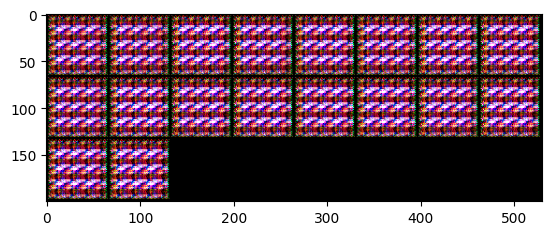

100%|██████████| 103/103 [01:40<00:00,  1.02it/s]


epoch: 1, lossD:1.6898537538583995, lossG:3.4647482784049024,lossG_fake:1.9259415830223305, lossG_real:1.5388067069562894 ,equality:0.38713487606604113


evaluate:102.33185577392578,kid_mean:0.0601784884929657, kid_std:0.024935048073530197,kid_:(tensor(0.0602), tensor(0.0249))


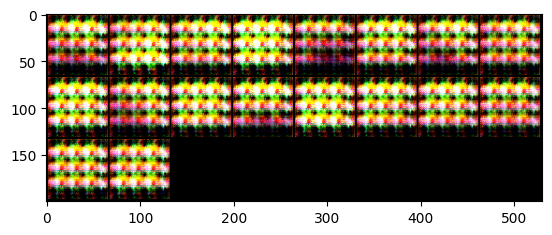

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 2, lossD:1.7915966094118878, lossG:2.830687429141072,lossG_fake:1.4928004782176711, lossG_real:1.3378869538168305 ,equality:0.1549135244008406


evaluate:95.0088882446289,kid_mean:0.05694985389709473, kid_std:0.03040764294564724,kid_:(tensor(0.0569), tensor(0.0304))


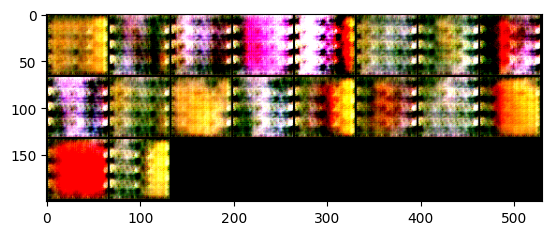

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 3, lossD:2.047832545724887, lossG:2.053311496105009,lossG_fake:1.072690788981984, lossG_real:0.9806207013361662 ,equality:0.0920700876458177


evaluate:95.4688949584961,kid_mean:0.05508126690983772, kid_std:0.03044276125729084,kid_:(tensor(0.0551), tensor(0.0304))


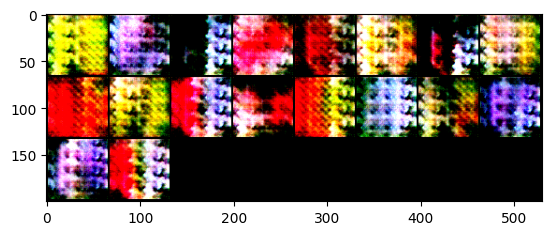

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 4, lossD:2.044801881012407, lossG:2.0878497466300296,lossG_fake:1.0801608521961472, lossG_real:1.0076888955912544 ,equality:0.0724719566048928


evaluate:104.26224517822266,kid_mean:0.060416799038648605, kid_std:0.030112626031041145,kid_:(tensor(0.0604), tensor(0.0301))


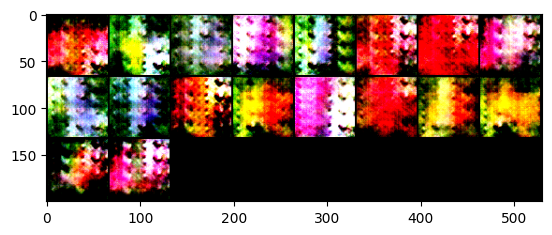

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 5, lossD:2.026493553976411, lossG:2.0558563389824434,lossG_fake:1.0606279535200989, lossG_real:0.9952283964573758 ,equality:0.06539955706272305


evaluate:96.43643188476562,kid_mean:0.052916496992111206, kid_std:0.027970029041171074,kid_:(tensor(0.0529), tensor(0.0280))


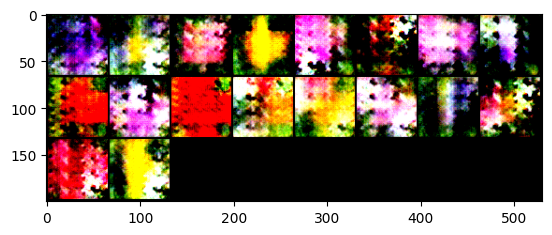

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 6, lossD:2.041147200806627, lossG:2.0771588469014586,lossG_fake:1.0605678830331968, lossG_real:1.016590970812492 ,equality:0.04397691222070477


evaluate:93.05182647705078,kid_mean:0.05658828839659691, kid_std:0.03463134542107582,kid_:(tensor(0.0566), tensor(0.0346))


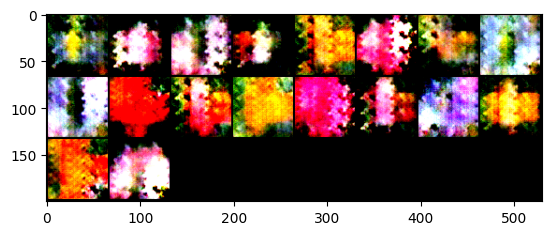

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 7, lossD:2.0144632973717256, lossG:2.0640499580253677,lossG_fake:1.0455475571086106, lossG_real:1.0185023986020134 ,equality:0.027045158506597167


evaluate:96.48539733886719,kid_mean:0.05376827344298363, kid_std:0.029338303953409195,kid_:(tensor(0.0538), tensor(0.0293))


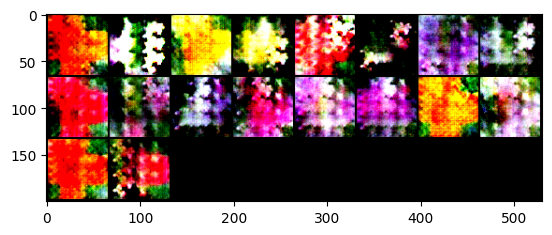

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 8, lossD:2.0216905897103468, lossG:2.07059605839183,lossG_fake:1.0585249731841597, lossG_real:1.0120710840502989 ,equality:0.04645388913386084


evaluate:90.97174072265625,kid_mean:0.05280815064907074, kid_std:0.0320577546954155,kid_:(tensor(0.0528), tensor(0.0321))


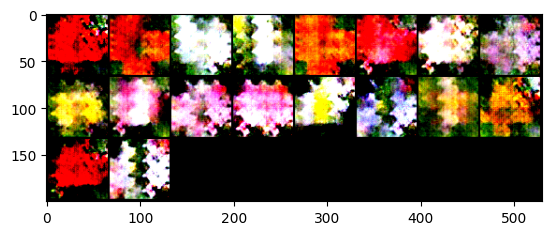

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 9, lossD:2.0062153802334683, lossG:2.0607941150665283,lossG_fake:1.060913131074998, lossG_real:0.9998809903570749 ,equality:0.06103214071792307


evaluate:97.06846618652344,kid_mean:0.055871590971946716, kid_std:0.0303408931940794,kid_:(tensor(0.0559), tensor(0.0303))


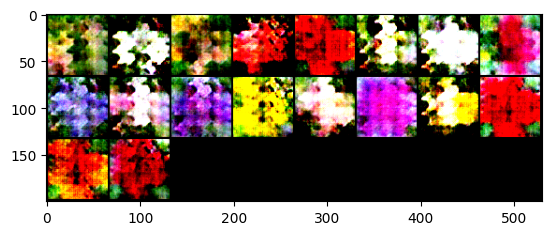

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 10, lossD:2.017542276567626, lossG:2.0650251374661344,lossG_fake:1.030124707708081, lossG_real:1.034900418184336 ,equality:-0.004775710476254913


evaluate:95.24726867675781,kid_mean:0.05729275196790695, kid_std:0.032127052545547485,kid_:(tensor(0.0573), tensor(0.0321))


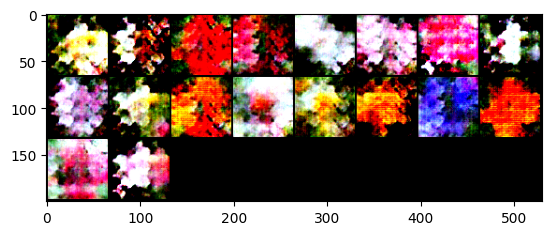

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 11, lossD:2.0049789877771174, lossG:2.0542986346679983,lossG_fake:1.0395191606966037, lossG_real:1.0147794658697924 ,equality:0.024739694826811265


evaluate:100.70822143554688,kid_mean:0.05901351943612099, kid_std:0.03393715247511864,kid_:(tensor(0.0590), tensor(0.0339))


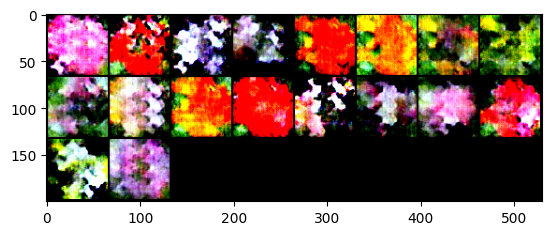

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 12, lossD:2.014715317383553, lossG:2.0584213826262836,lossG_fake:1.0520080038644735, lossG_real:1.0064133868634122 ,equality:0.045594617001061266


evaluate:104.1393051147461,kid_mean:0.058456867933273315, kid_std:0.031238019466400146,kid_:(tensor(0.0585), tensor(0.0312))


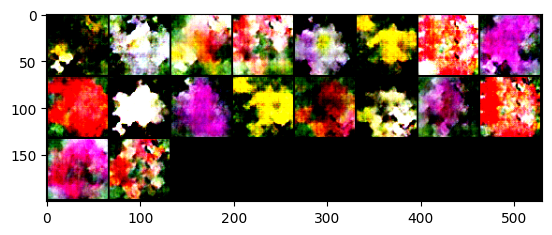

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 13, lossD:2.0084847802097356, lossG:2.04982958488094,lossG_fake:1.0438974372391563, lossG_real:1.0059321534286425 ,equality:0.037965283810513784


evaluate:106.00029754638672,kid_mean:0.06503719091415405, kid_std:0.033038362860679626,kid_:(tensor(0.0650), tensor(0.0330))


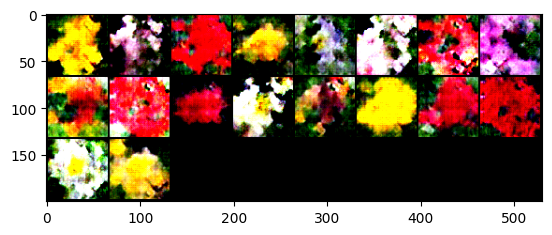

100%|██████████| 103/103 [01:40<00:00,  1.03it/s]


epoch: 14, lossD:2.020968545987768, lossG:2.068550008014568,lossG_fake:1.0616524323676397, lossG_real:1.0068975802764153 ,equality:0.05475485209122444


evaluate:109.8656005859375,kid_mean:0.06686090677976608, kid_std:0.0385657474398613,kid_:(tensor(0.0669), tensor(0.0386))


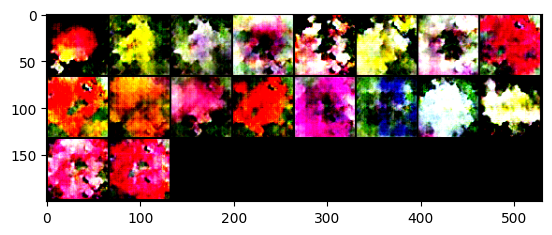

100%|██████████| 103/103 [01:40<00:00,  1.02it/s]


epoch: 15, lossD:2.0026357278083133, lossG:2.0544690622866733,lossG_fake:1.03983971389752, lossG_real:1.0146293414449228 ,equality:0.025210372452597163


evaluate:112.40633392333984,kid_mean:0.0717269778251648, kid_std:0.036489661782979965,kid_:(tensor(0.0717), tensor(0.0365))


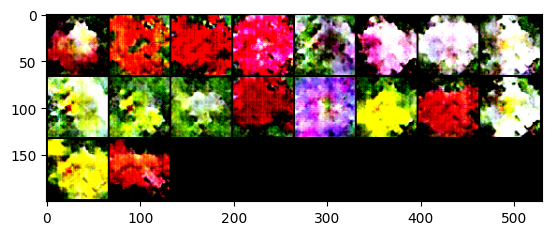

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 16, lossD:2.0080679145831506, lossG:2.062809143251586,lossG_fake:1.0430373022857222, lossG_real:1.0197718461740364 ,equality:0.023265456111685845


evaluate:112.05500030517578,kid_mean:0.07260427623987198, kid_std:0.03250552713871002,kid_:(tensor(0.0726), tensor(0.0325))


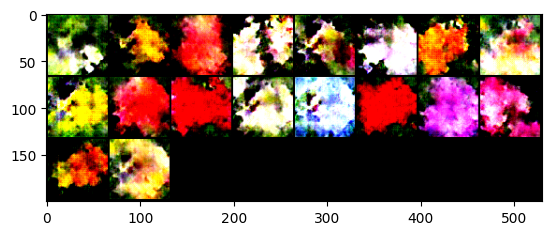

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 17, lossD:2.002756474087539, lossG:2.052542783681629,lossG_fake:1.0433578983093927, lossG_real:1.0091848853722358 ,equality:0.03417301293715691


evaluate:112.69218444824219,kid_mean:0.07426398992538452, kid_std:0.03857104480266571,kid_:(tensor(0.0743), tensor(0.0386))


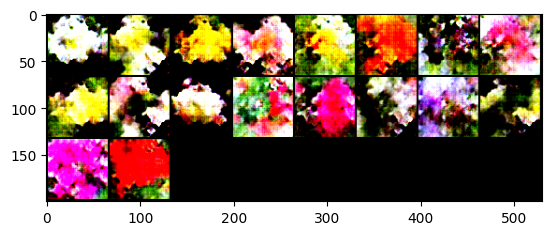

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 18, lossD:2.0275644110244455, lossG:2.0842644126669874,lossG_fake:1.0627646486736038, lossG_real:1.02149976167864 ,equality:0.04126488699496367


evaluate:111.08594512939453,kid_mean:0.06788888573646545, kid_std:0.03357260301709175,kid_:(tensor(0.0679), tensor(0.0336))


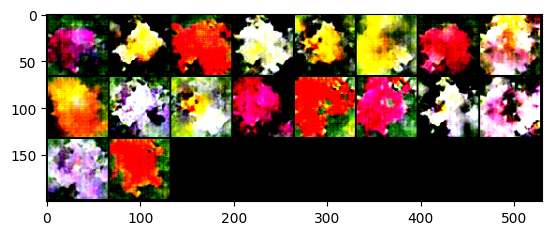

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 19, lossD:1.9963490430591175, lossG:2.0636876462732703,lossG_fake:1.046327846721538, lossG_real:1.017359792607502 ,equality:0.028968054114036024


evaluate:114.78614044189453,kid_mean:0.08366324752569199, kid_std:0.04053402319550514,kid_:(tensor(0.0837), tensor(0.0405))


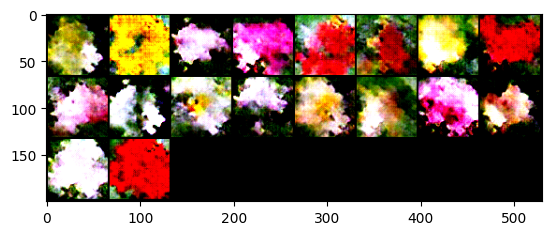

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 20, lossD:2.008775564073359, lossG:2.084736848340451,lossG_fake:1.0674413870839239, lossG_real:1.0172954745663023 ,equality:0.05014591251762157


evaluate:112.7253646850586,kid_mean:0.07457593828439713, kid_std:0.040939267724752426,kid_:(tensor(0.0746), tensor(0.0409))


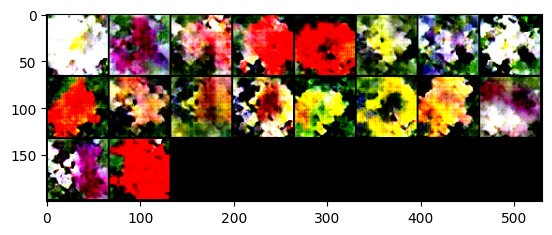

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 21, lossD:1.9957185833199511, lossG:2.0596052049433142,lossG_fake:1.0377651829164005, lossG_real:1.021840030128516 ,equality:0.015925152787884533


evaluate:114.40632629394531,kid_mean:0.07496172189712524, kid_std:0.040998149663209915,kid_:(tensor(0.0750), tensor(0.0410))


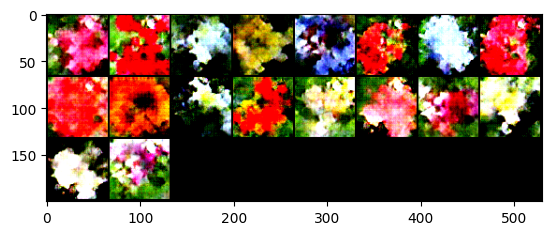

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 22, lossD:2.0227021650203225, lossG:2.100177313517598,lossG_fake:1.0663948614620469, lossG_real:1.0337824572637244 ,equality:0.03261240419832245


evaluate:114.17896270751953,kid_mean:0.07347369194030762, kid_std:0.033836573362350464,kid_:(tensor(0.0735), tensor(0.0338))


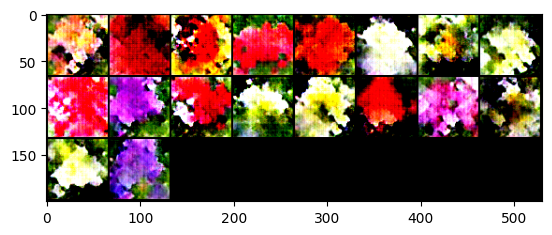

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 23, lossD:2.0112276401334594, lossG:2.1633646627074308,lossG_fake:1.0947637048739831, lossG_real:1.0686009497318454 ,equality:0.026162755142137728


evaluate:113.67940521240234,kid_mean:0.07384634017944336, kid_std:0.03876956179738045,kid_:(tensor(0.0738), tensor(0.0388))


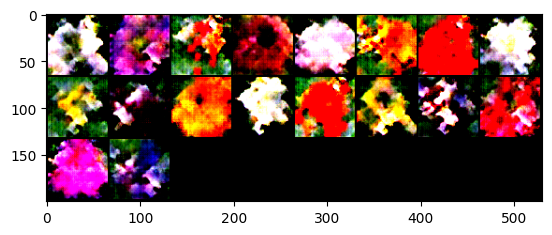

100%|██████████| 103/103 [01:41<00:00,  1.01it/s]


epoch: 24, lossD:1.994411921038211, lossG:2.13727280005668,lossG_fake:1.0940813584235107, lossG_real:1.0431914375823679 ,equality:0.050889920841142855


evaluate:116.07661437988281,kid_mean:0.0816347673535347, kid_std:0.041976794600486755,kid_:(tensor(0.0816), tensor(0.0420))


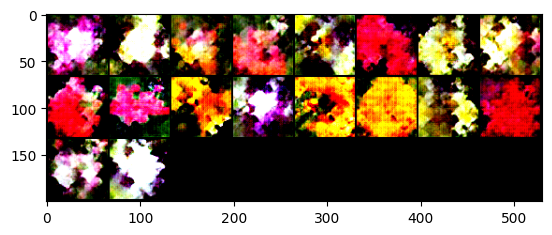

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 25, lossD:1.987837426870772, lossG:2.110497569574893,lossG_fake:1.0981404989668466, lossG_real:1.0123570740801617 ,equality:0.08578342488668489


evaluate:116.4327621459961,kid_mean:0.08184140920639038, kid_std:0.03645017743110657,kid_:(tensor(0.0818), tensor(0.0365))


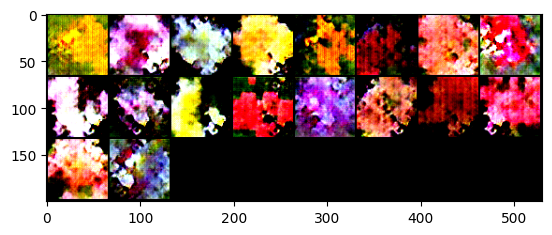

100%|██████████| 103/103 [01:41<00:00,  1.01it/s]


epoch: 26, lossD:1.9859134329175485, lossG:2.111545122942878,lossG_fake:1.0743316718675557, lossG_real:1.0372134510753224 ,equality:0.03711822079223337


evaluate:115.03633880615234,kid_mean:0.07612693309783936, kid_std:0.044704314321279526,kid_:(tensor(0.0761), tensor(0.0447))


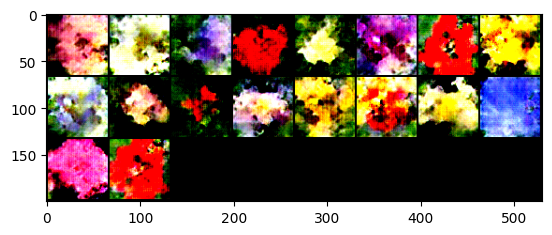

100%|██████████| 103/103 [01:41<00:00,  1.01it/s]


epoch: 27, lossD:1.9870907334448065, lossG:2.1016324700661078,lossG_fake:1.0829265071350394, lossG_real:1.0187059571442094 ,equality:0.06422054999082993


evaluate:111.43938446044922,kid_mean:0.08324985206127167, kid_std:0.04203185439109802,kid_:(tensor(0.0832), tensor(0.0420))


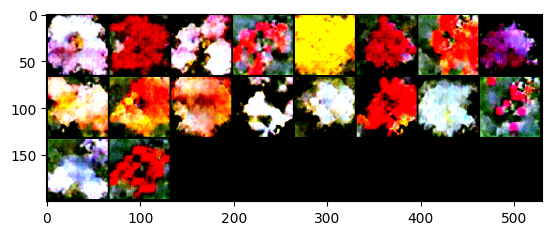

100%|██████████| 103/103 [01:41<00:00,  1.01it/s]


epoch: 28, lossD:1.9852784247074313, lossG:2.127494684700827,lossG_fake:1.0978456301596557, lossG_real:1.0296490626427734 ,equality:0.0681965675168823


evaluate:112.084716796875,kid_mean:0.0782557800412178, kid_std:0.040084805339574814,kid_:(tensor(0.0783), tensor(0.0401))


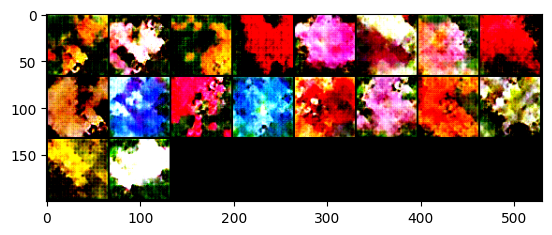

100%|██████████| 103/103 [01:41<00:00,  1.01it/s]


epoch: 29, lossD:1.9949928961911247, lossG:2.140358260534342,lossG_fake:1.102739159343312, lossG_real:1.0376191075565746 ,equality:0.06512005178673741


evaluate:110.44930267333984,kid_mean:0.06982550024986267, kid_std:0.03476560115814209,kid_:(tensor(0.0698), tensor(0.0348))


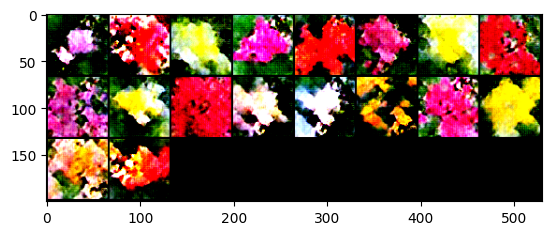

100%|██████████| 103/103 [01:41<00:00,  1.01it/s]


epoch: 30, lossD:1.973635246452776, lossG:2.1623744802567564,lossG_fake:1.125949150150262, lossG_real:1.0364253422588978 ,equality:0.08952380789136427


evaluate:110.74282836914062,kid_mean:0.07547419518232346, kid_std:0.03334028646349907,kid_:(tensor(0.0755), tensor(0.0333))


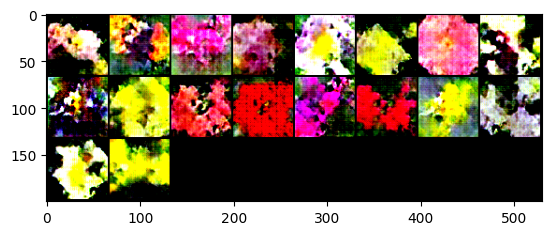

100%|██████████| 103/103 [01:41<00:00,  1.01it/s]


epoch: 31, lossD:1.961365736803962, lossG:2.1727665373422567,lossG_fake:1.113143386192692, lossG_real:1.0596231523069364 ,equality:0.053520233885755664


evaluate:111.25955963134766,kid_mean:0.07907935976982117, kid_std:0.04047781974077225,kid_:(tensor(0.0791), tensor(0.0405))


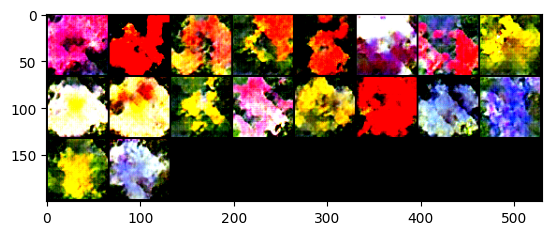

100%|██████████| 103/103 [01:41<00:00,  1.01it/s]


epoch: 32, lossD:1.9624405786829087, lossG:2.2400284206982954,lossG_fake:1.151364371035863, lossG_real:1.0886640647082653 ,equality:0.06270030632759771


evaluate:111.43417358398438,kid_mean:0.0801028460264206, kid_std:0.046516962349414825,kid_:(tensor(0.0801), tensor(0.0465))


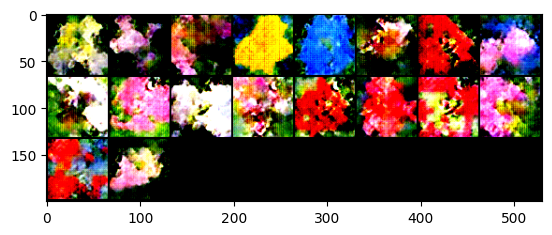

100%|██████████| 103/103 [01:41<00:00,  1.01it/s]


epoch: 33, lossD:1.943396473393857, lossG:2.2991848871545884,lossG_fake:1.1815884113311768, lossG_real:1.1175964729299823 ,equality:0.06399193840119444


evaluate:110.5324935913086,kid_mean:0.07493086159229279, kid_std:0.03866039216518402,kid_:(tensor(0.0749), tensor(0.0387))


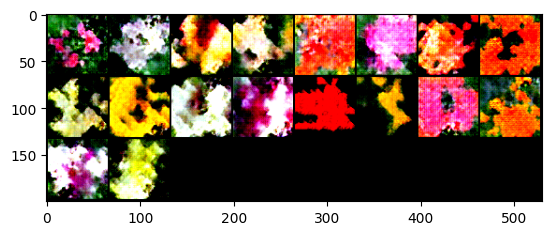

100%|██████████| 103/103 [01:41<00:00,  1.01it/s]


epoch: 34, lossD:1.902460989442844, lossG:2.3251000700645075,lossG_fake:1.2005689491346045, lossG_real:1.1245311174577879 ,equality:0.07603783167681666


evaluate:110.06017303466797,kid_mean:0.07056613266468048, kid_std:0.03452194854617119,kid_:(tensor(0.0706), tensor(0.0345))


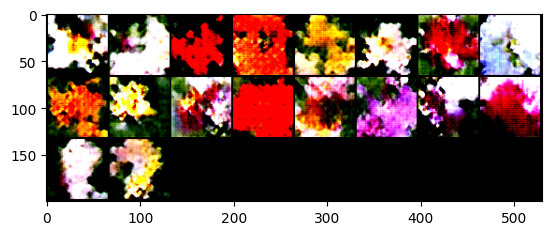

100%|██████████| 103/103 [01:41<00:00,  1.01it/s]


epoch: 35, lossD:1.881673037427143, lossG:2.43056114668985,lossG_fake:1.2609401327892416, lossG_real:1.1696210231595827 ,equality:0.09131910962965883


evaluate:111.49310302734375,kid_mean:0.07669193297624588, kid_std:0.04090274125337601,kid_:(tensor(0.0767), tensor(0.0409))


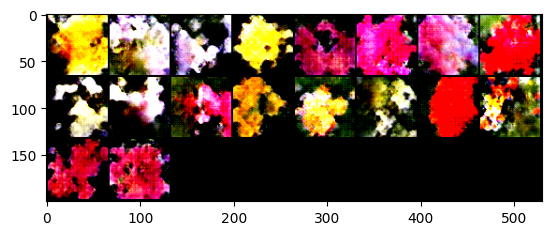

100%|██████████| 103/103 [01:41<00:00,  1.01it/s]


epoch: 36, lossD:1.8110257340866385, lossG:2.5842928608644358,lossG_fake:1.3250766552767708, lossG_real:1.2592162015368638 ,equality:0.06586045373990701


evaluate:112.95928955078125,kid_mean:0.07711406797170639, kid_std:0.035308606922626495,kid_:(tensor(0.0771), tensor(0.0353))


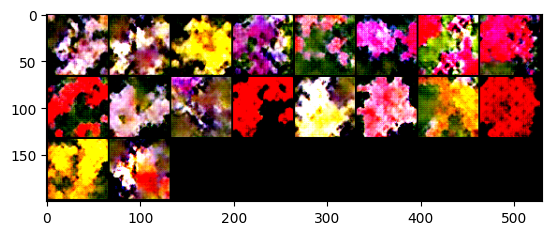

100%|██████████| 103/103 [01:41<00:00,  1.01it/s]


epoch: 37, lossD:1.7347998005672567, lossG:2.767999283318381,lossG_fake:1.4319584277069684, lossG_real:1.3360408625556428 ,equality:0.09591756515132555


evaluate:112.94831085205078,kid_mean:0.07715044170618057, kid_std:0.039879169315099716,kid_:(tensor(0.0772), tensor(0.0399))


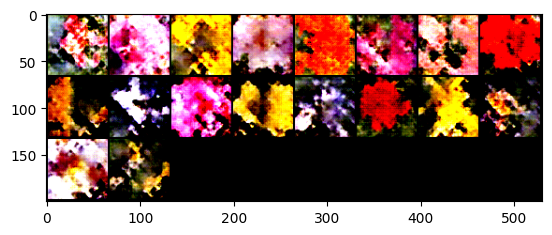

100%|██████████| 103/103 [01:41<00:00,  1.01it/s]


epoch: 38, lossD:1.6881489915755188, lossG:2.8933544158935547,lossG_fake:1.5006574126123224, lossG_real:1.3926969928648865 ,equality:0.10796041974743598


evaluate:113.24726867675781,kid_mean:0.07248794287443161, kid_std:0.04018183425068855,kid_:(tensor(0.0725), tensor(0.0402))


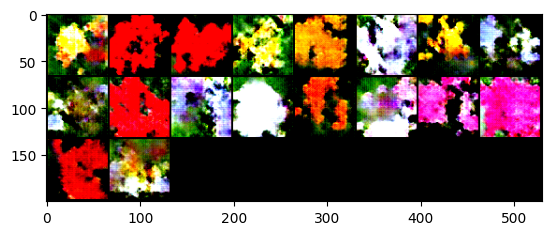

100%|██████████| 103/103 [01:41<00:00,  1.01it/s]


epoch: 39, lossD:1.5948020323966314, lossG:3.1067928897524344,lossG_fake:1.6222263470436762, lossG_real:1.4845665328710982 ,equality:0.137659814172578


evaluate:112.99896240234375,kid_mean:0.07530604302883148, kid_std:0.04111754894256592,kid_:(tensor(0.0753), tensor(0.0411))


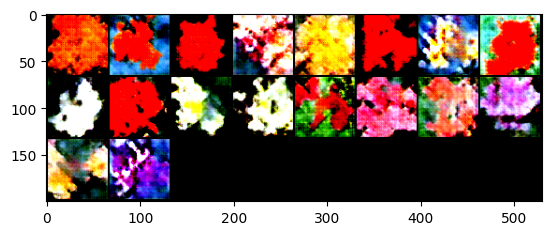

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 40, lossD:1.495312579627176, lossG:3.3381275644580137,lossG_fake:1.73366447444101, lossG_real:1.6044630958038626 ,equality:0.1292013786371473


evaluate:112.56851196289062,kid_mean:0.0717209056019783, kid_std:0.04074496030807495,kid_:(tensor(0.0717), tensor(0.0407))


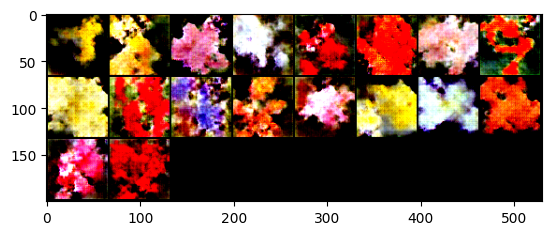

100%|██████████| 103/103 [01:41<00:00,  1.01it/s]


epoch: 41, lossD:1.4389477638364996, lossG:3.4447254648486387,lossG_fake:1.7938771977007968, lossG_real:1.6508482735133865 ,equality:0.1430289241874103


evaluate:113.70433807373047,kid_mean:0.0748738944530487, kid_std:0.036511506885290146,kid_:(tensor(0.0749), tensor(0.0365))


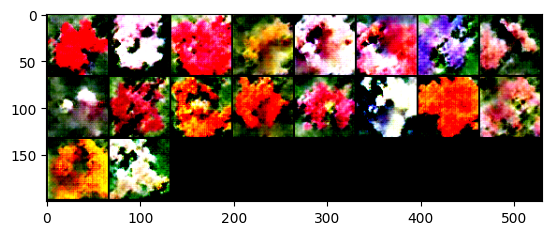

100%|██████████| 103/103 [01:41<00:00,  1.01it/s]


epoch: 42, lossD:1.3312107920646667, lossG:3.70173021427636,lossG_fake:1.9302904860487262, lossG_real:1.771439736329236 ,equality:0.1588507497194902


evaluate:112.7586441040039,kid_mean:0.0762457549571991, kid_std:0.036370228976011276,kid_:(tensor(0.0762), tensor(0.0364))


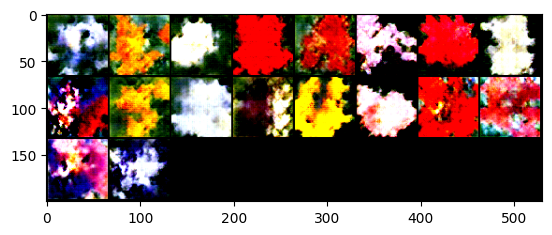

100%|██████████| 103/103 [01:41<00:00,  1.01it/s]


epoch: 43, lossD:1.1654827542675352, lossG:4.092713899982786,lossG_fake:2.1251814625795604, lossG_real:1.9675324449261415 ,equality:0.15764901765341888


evaluate:113.4794921875,kid_mean:0.07380688935518265, kid_std:0.0353526808321476,kid_:(tensor(0.0738), tensor(0.0354))


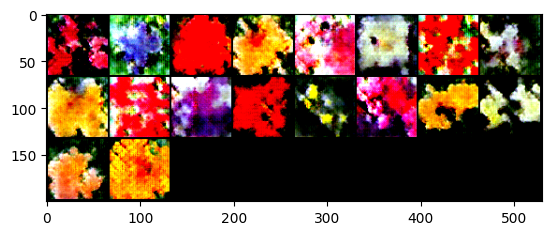

100%|██████████| 103/103 [01:41<00:00,  1.01it/s]


epoch: 44, lossD:1.1064941547449352, lossG:4.410551969287465,lossG_fake:2.288469848123569, lossG_real:2.122082107275435 ,equality:0.1663877408481338


evaluate:112.92341613769531,kid_mean:0.07203555107116699, kid_std:0.03526625409722328,kid_:(tensor(0.0720), tensor(0.0353))


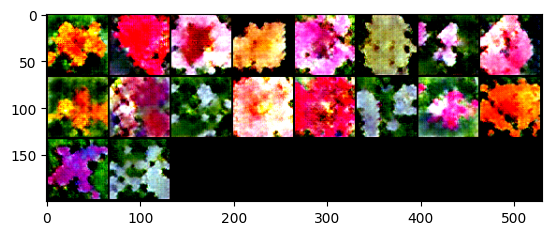

100%|██████████| 103/103 [01:41<00:00,  1.01it/s]


epoch: 45, lossD:0.9394700457748858, lossG:4.868529680863167,lossG_fake:2.532338464144364, lossG_real:2.336191245653097 ,equality:0.19614721849126715


evaluate:112.86109161376953,kid_mean:0.07444676756858826, kid_std:0.038793377578258514,kid_:(tensor(0.0744), tensor(0.0388))


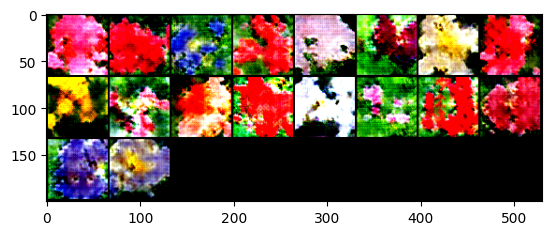

100%|██████████| 103/103 [01:41<00:00,  1.01it/s]


epoch: 46, lossD:0.8962803859878512, lossG:5.0581425787175744,lossG_fake:2.6418055203354474, lossG_real:2.4163370410215506 ,equality:0.2254684793138968


evaluate:113.24700927734375,kid_mean:0.07132750749588013, kid_std:0.036800406873226166,kid_:(tensor(0.0713), tensor(0.0368))


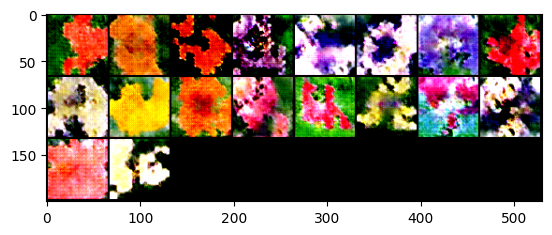

100%|██████████| 103/103 [01:41<00:00,  1.01it/s]


epoch: 47, lossD:0.7854053489502194, lossG:5.212555241816252,lossG_fake:2.7046225904261023, lossG_real:2.5079326716441552 ,equality:0.19668991878194708


evaluate:112.79134368896484,kid_mean:0.07329478859901428, kid_std:0.03641147166490555,kid_:(tensor(0.0733), tensor(0.0364))


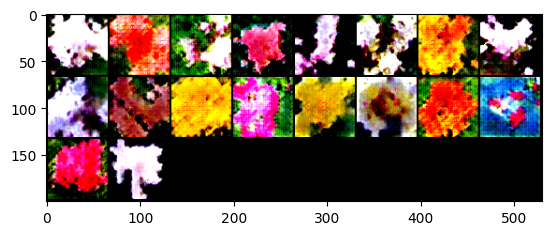

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 48, lossD:0.6331119696130452, lossG:5.7185457979591146,lossG_fake:2.993188643918454, lossG_real:2.7253571598275195 ,equality:0.2678314840909346


evaluate:113.33444213867188,kid_mean:0.0728616714477539, kid_std:0.0390816293656826,kid_:(tensor(0.0729), tensor(0.0391))


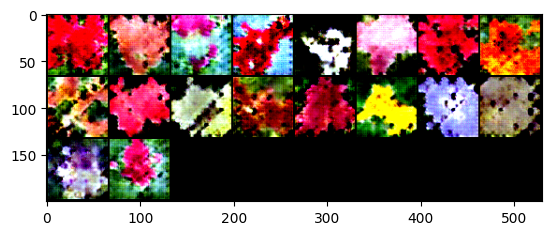

100%|██████████| 103/103 [01:41<00:00,  1.01it/s]


epoch: 49, lossD:0.5150569356543925, lossG:5.854227505841301,lossG_fake:3.049135941324882, lossG_real:2.805091566252477 ,equality:0.24404437507240528


evaluate:113.67871856689453,kid_mean:0.07459830492734909, kid_std:0.037103429436683655,kid_:(tensor(0.0746), tensor(0.0371))


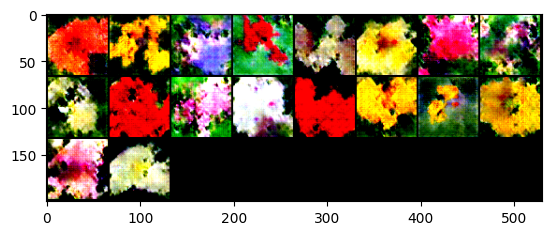

In [44]:
lossesD = []
lossesG = []

raw_lossesD = []
raw_lossesG = []
lossesG_fake = []
lossesG_real = []

equality = 0.0
sum_equality = 0.0
d_equality = []

relu = torch.nn.ReLU()

fid_ = []
kid_mean_ = []
kid_std_ = []
kid_score = []
for epoch in range(opt.n_epoch):
    running_lossD = 0.0 #損失関数初期化
    running_lossG = 0.0
    lossG_fake_running = 0.0
    lossG_real_running = 0.0

    #sum_equality += equality
    equality = 0.0
   # for i , (real_imgs, _) in enumerate(tqdm.tqdm(dataloader, position = 0)):#celebA
    for i , real_imgs in enumerate(tqdm.tqdm(dataloader, position = 0)):#flower
        real_imgs = real_imgs.to(device)
        batch_size = real_imgs.size()[0]
        noise = torch.randn(batch_size, opt.z_dim, 1, 1).to(device)

        #train discriminator

        netD.zero_grad()
        output_real = netD(real_imgs)

        #lossD_real = criterion(output, labels_real)
        lossD_real = torch.mean(relu(1.0 - output_real))


        fake_imgs = netG(noise)##not train  output_fake_d
        output_fake_d = netD(fake_imgs.detach())#not train  output_fake_d

        #lossD_fake = criterion(output, labels_fake)
        lossD_fake = torch.mean(relu(1.0 + output_fake_d))


        lossD = lossD_real + lossD_fake
        #lossD = torch.mean(torch.log(torch.sigmoid(output_real)))- torch.mean(torch.log(torch.sigmoid(output_fake_d)))  #not train  output_fake_d
        lossD.backward()
        optimizerD.step()

        #train generator

        netG.zero_grad()#勾配初期

        output_fake_g = netD(fake_imgs)#train  output_fake_g
        output_real = netD(real_imgs)

        lossG_fake = torch.mean(relu(1.0 - output_fake_g))
        lossG_real = torch.mean(relu(1.0 + output_real))
        #lossG =  torch.mean(torch.log(torch.sigmoid(output_fake_g - output_real))) #- torch.mean(torch.log(torch.sigmoid(output_real)))#train  output_fake_g
        lossG =    lossG_real + lossG_fake


        lossG.backward()
        optimizerG.step()

        # save loss

        running_lossD += lossD.item()
        running_lossG += lossG.item()

        raw_lossesD.append(lossD.item())
        raw_lossesG.append(lossG.item())

        lossG_fake_running += lossG_fake.item()
        lossG_real_running += lossG_real.item()



    running_lossD /=len(dataloader)
    running_lossG /=len(dataloader)

    lossG_fake_running /= len(dataloader)
    lossG_real_running /= len(dataloader)
#equality
    equality = ( lossG_fake_running - lossG_real_running  )
    d_equality.append(equality)


    print("epoch: {}, lossD:{}, lossG:{},lossG_fake:{}, lossG_real:{} ,equality:{}".format(epoch, running_lossD, running_lossG,lossG_fake_running,lossG_real_running,equality))#-->,lossG_fake:{}, lossG_real:{},lossG_fake_running,lossG_real_running
    lossesD.append(running_lossD)
    lossesG.append(running_lossG)

    lossesG_fake.append(lossG_fake_running)
    lossesG_real.append(lossG_real_running)

     #evaluate GAN
    fake_imgs_1 = fake_imgs.detach()
    real_imgs_1 = real_imgs.to(dtype=torch.uint8).cpu()
    fake_imgs_1 = fake_imgs_1.to(dtype=torch.uint8).cpu()
    fid.update(real_imgs_1, real=True)
    fid.update(fake_imgs_1, real=False)
    eval = fid.compute()

    kid.update(real_imgs_1, real=True)
    kid.update(fake_imgs_1, real=False)
    kid_ = kid.compute()
    kid_mean, kid_std = kid.compute()



    print("evaluate:{},kid_mean:{}, kid_std:{},kid_:{}".format(eval, kid_mean, kid_std, kid_))
    fid_.append(eval)
    kid_mean_.append(kid_mean)
    kid_std_.append(kid_std)
    kid_score.append(kid_)
    #show fake image
    grid_imgs = vutils.make_grid(fake_imgs[:24].detach()+0.5)
    grid_imgs_arr = grid_imgs.cpu().numpy()
    plt.imshow(np.transpose(grid_imgs_arr, (1,2,0)))
    plt.show()

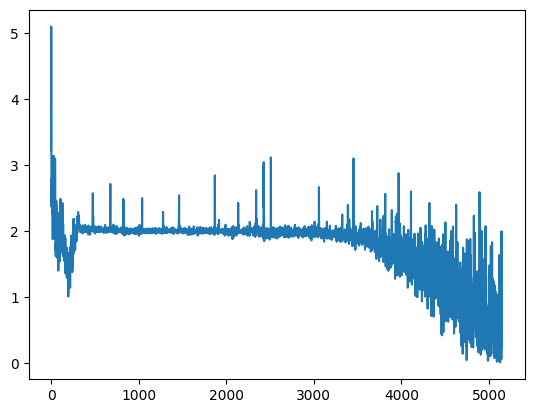

In [45]:
plt.plot(raw_lossesD)

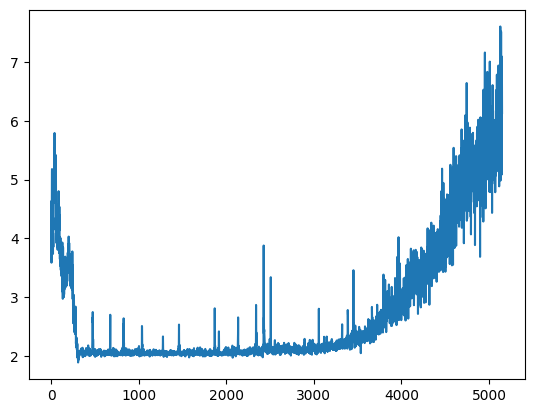

In [46]:
plt.plot(raw_lossesG)

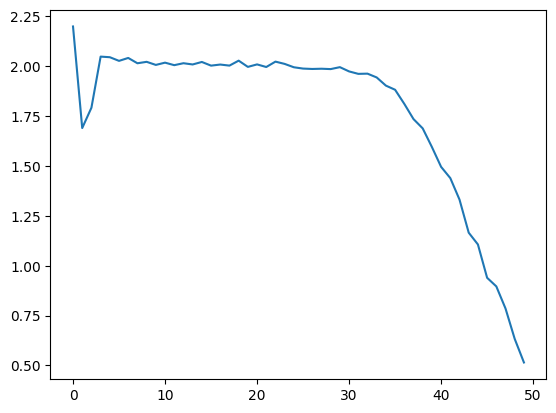

In [47]:
plt.plot(lossesD)

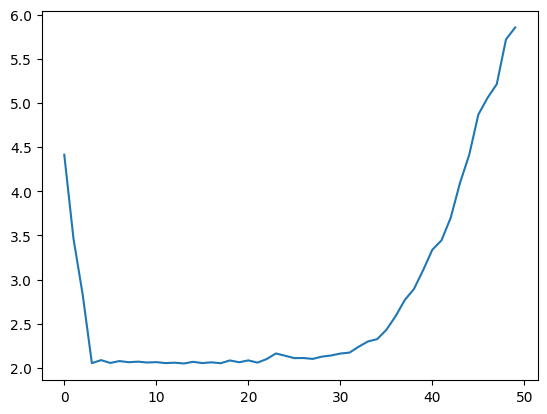

In [48]:
plt.plot(lossesG)

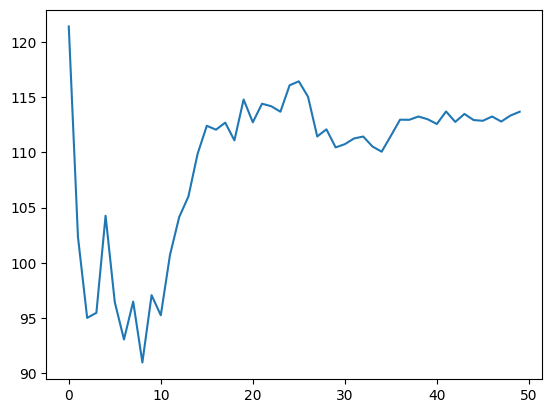

In [49]:
plt.plot(fid_)

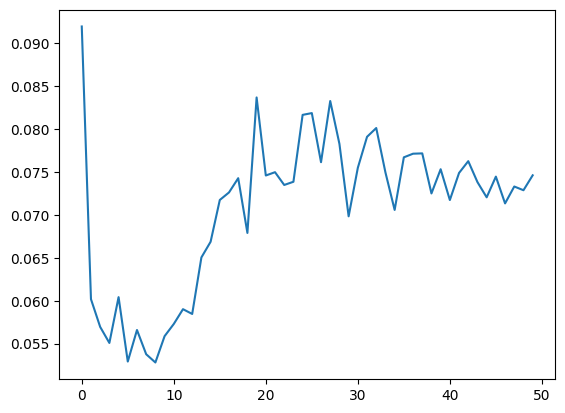

In [50]:
plt.plot(kid_mean_)

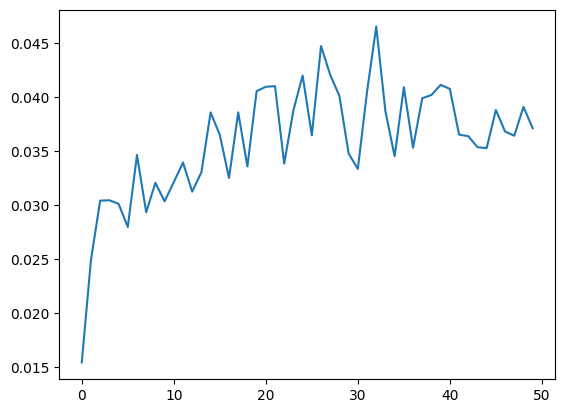

In [51]:
plt.plot(kid_std_)

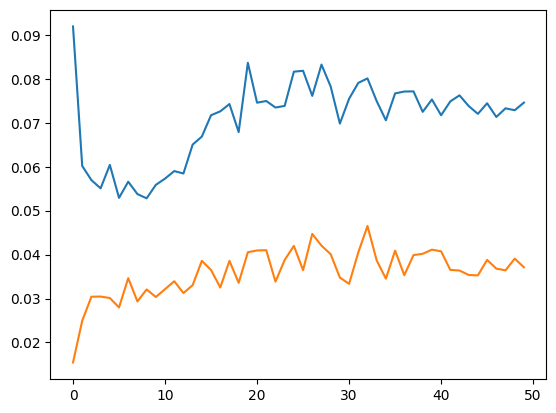

In [52]:
plt.plot(kid_score)

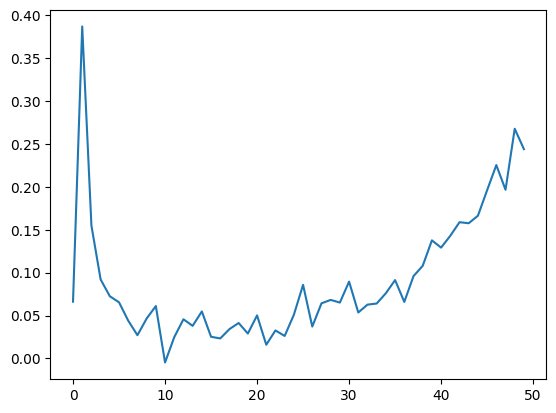

In [53]:
plt.plot(d_equality)

In [54]:

import torch
!pip install torcheval


from torcheval.metrics import PeakSignalNoiseRatio
import torch
import torchvision
#from torcheval.metrics import StructuralSimilarity

real_imgs = real_imgs.to(dtype=torch.uint8).cpu()
fake_imgs = fake_imgs.to(dtype=torch.uint8).cpu()
fid.update(real_imgs, real=True)
fid.update(fake_imgs, real=False)
print(f'fid ',fid.compute())

kid.update(real_imgs, real=True)
kid.update(fake_imgs, real=False)
print(f'kid ',kid.compute())

metric = PeakSignalNoiseRatio()
#input = torch.tensor([[0.1, 0.2], [0.3, 0.4]])
#>>> target = input * 0.9
metric.update(fake_imgs,real_imgs)
print(f'PSNR',metric.compute())#高いほどいい
#PSNR (Peak Signal-to-Noise Ratio): PSNRは、生成画像と本物の画像の間のノイズの量を測定します。高いPSNRは、より低いノイズレベルを示します。

import torch
from skimage.metrics import structural_similarity as ssim
import numpy as np

# 例えば、real_imageが与えられているとします
real_image =real_imgs # 仮のランダムな画像データ
fake_image =fake_imgs
# PyTorch TensorをNumPy配列に変換
real_image_np = real_image.cpu().numpy()

# SSIMを計算するために、0から1の範囲に正規化することが推奨されます
real_image_np = np.clip((real_image_np + 1) / 2.0, 0, 1)

# PyTorch TensorをNumPy配列に変換
fake_image_np = fake_image.cpu().numpy()

# SSIMを計算するために、0から1の範囲に正規化することが推奨されます
fake_image_np = np.clip((fake_image_np + 1) / 2.0, 0, 1)

# SSIMを計算
ssim_value = ssim(real_image_np[0], fake_image_np[0], win_size=3)
print(f"SSIM値: {ssim_value}")
#SSIMは、画像の品質を評価するための指標であり、生成画像と本物の画像の構造的な類似性を測定します。1に近い値が高い品質を示します。

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.2/179.2 kB 3.0 MB/s eta 0:00:00
fid  tensor(114.3850)
kid  (tensor(0.0718), tensor(0.0394))
PSNR tensor(69.2509)
SSIM値: 0.9873873026748885
